<a href="https://colab.research.google.com/github/myller-silva/Explications-ANNs/blob/main/Plotagem.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [397]:
import ast
import numpy as np
import pandas as pd
import tensorflow as tf
from typing import List, Tuple
import matplotlib.pyplot as plt
from matplotlib_venn import venn3, venn2
import matplotlib.patches as patches

In [398]:
from google.colab import drive
drive.mount('/content/drive')
base_path = '/content/drive/My Drive/explications-anns'

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [399]:
datasets_path = f'{base_path}/datasets'
results_path = f'{datasets_path}/digits/results'

In [400]:
def read_dataset(dir_path:str, model_h5_file:str):
  data_test = pd.read_csv(f"{dir_path}/test.csv")
  data_train = pd.read_csv(f"{dir_path}/train.csv")
  data = data_train._append(data_test)

  model_h5 = tf.keras.models.load_model(f"{dir_path}/{model_h5_file}")
  return (data, model_h5)

In [442]:
model_h5_file = 'models/model_3layers_20neurons.h5'
(data, model_h5) = read_dataset(f'{datasets_path}/digits', model_h5_file)

In [450]:
result_df = pd.read_csv(f'{results_path}/{model_h5_file}/df.csv')
len(result_df)

503

In [531]:
result_df = result_df[(result_df["len_relaxado"] != 64) | (result_df["len_relaxado_global"] != 64)]
result_df[10:15]

,instance_index,tempo_original,tempo_relaxado,tempo_relaxado_global,len_original,len_relaxado,len_relaxado_global,delta,explanation,explanation_relaxed,explanation_relaxed_global
18,15,NaN,1.067622,1.081135,NaN,38,42,0.1,NaN,"[(1, 3), (1, 4), (1, 5), (2, 1), (2, 2), (2, 3...","[(0, 2), (0, 3), (0, 4), (0, 7), (1, 1), (1, 2..."
21,18,NaN,2.719758,1.110520,NaN,23,34,0.1,NaN,"[(3, 4), (3, 6), (4, 1), (4, 2), (4, 3), (4, 4...","[(0, 4), (1, 1), (1, 3), (1, 4), (2, 2), (2, 3..."
22,19,NaN,1.118289,1.125991,NaN,31,39,0.1,NaN,"[(1, 4), (1, 5), (2, 2), (2, 3), (2, 4), (2, 6...","[(0, 3), (0, 4), (0, 5), (1, 0), (1, 3), (1, 4..."
24,21,NaN,1.174740,1.143513,NaN,19,35,0.1,NaN,"[(4, 3), (4, 4), (5, 0), (5, 2), (5, 3), (5, 4...","[(0, 4), (1, 1), (1, 3), (1, 4), (1, 5), (2, 1..."
25,22,NaN,1.133453,1.078235,NaN,35,36,0.1,NaN,"[(1, 6), (2, 1), (2, 2), (2, 3), (2, 4), (2, 5...","[(0, 5), (1, 1), (1, 2), (1, 3), (1, 6), (2, 2..."


In [536]:
len(result_df.query("len_relaxado < len_relaxado_global"))

253

In [534]:
len(result_df.query("len_relaxado > len_relaxado_global"))

9

In [453]:
def string_to_list(string):
    return ast.literal_eval(string)

In [454]:
def not_in_explanation(explanation: List[Tuple[int, int]], dimension: Tuple[int, int] = (8, 8)):
  x, y = dimension
  array = []
  for i in range(x):
    for j in range(y):
      if (i, j) not in explanation:
        array.append((i, j))
  return array

In [455]:
def show_image_with_explanation(ax, df: pd.DataFrame, instancia_index: int, explanation: list, explanation_name: str):
    instancia_values = df.iloc[instancia_index, :-1].values
    instancia = instancia_values.reshape(8, 8)

    ax.imshow(instancia, cmap="gray")

    target = df.iloc[instancia_index, -1]

    ax.text(0.5, -0.1, f"Target: {target}", fontsize=12, ha="center", transform=ax.transAxes )

    not_in_exp = not_in_explanation(explanation, (8, 8))
    for i, j in not_in_exp:
        rect = patches.Rectangle((j - 0.5, i - 0.5), 1, 1, linewidth=1, edgecolor="r", facecolor="r", alpha=1)
        ax.add_patch(rect)

    # Adicionar texto com o nome da explicação e quantidade de pixels
    ax.text(0.5, 1.05,f"{explanation_name} ({len(explanation)} pixels)",fontsize=12,ha="center",transform=ax.transAxes)


In [456]:
# for index in range(len(result_df)):
#     explanation_names = ["explanation", "explanation_relaxed", "explanation_relaxed_global"]
#     fig, axs = plt.subplots(1, 3, figsize=(15, 5))
#     for i, ax in enumerate(axs):
#         explanation_name = explanation_names[i]
#         explanation_data = result_df.iloc[index][explanation_name]
#         if pd.isna(explanation_data):
#             ax.text(0.5, 0.5, "NAN", fontsize=12, ha="center")
#             ax.axis('off')  # Desativar os eixos do gráfico
#         else:
#             show_image_with_explanation(
#                 ax, data, index,
#                 string_to_list(explanation_data),
#                 explanation_name
#             )
#     plt.show()


/usr/local/lib/python3.10/dist-packages/matplotlib_venn/_venn3.py:57: UserWarning: Circle B has zero area
  warnings.warn("Circle B has zero area")
/usr/local/lib/python3.10/dist-packages/matplotlib_venn/_venn3.py:61: UserWarning: Circle C has zero area
  warnings.warn("Circle C has zero area")


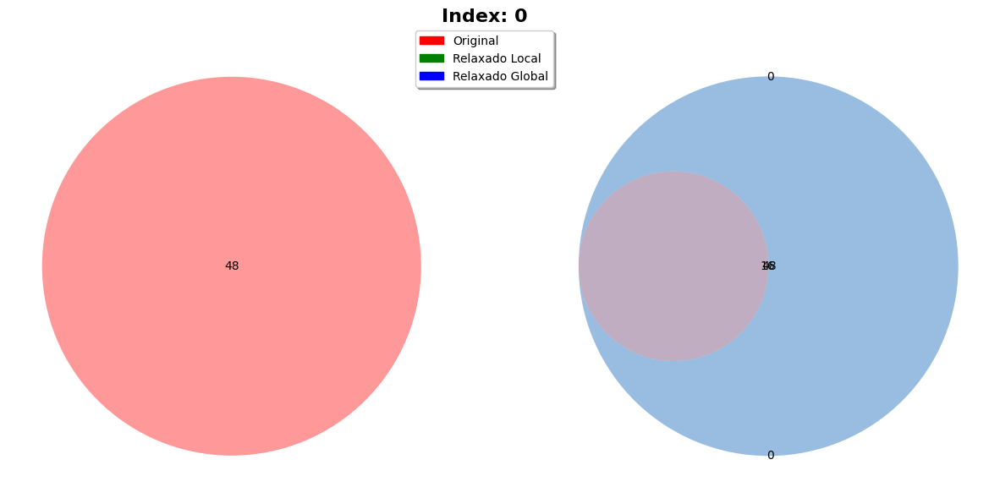

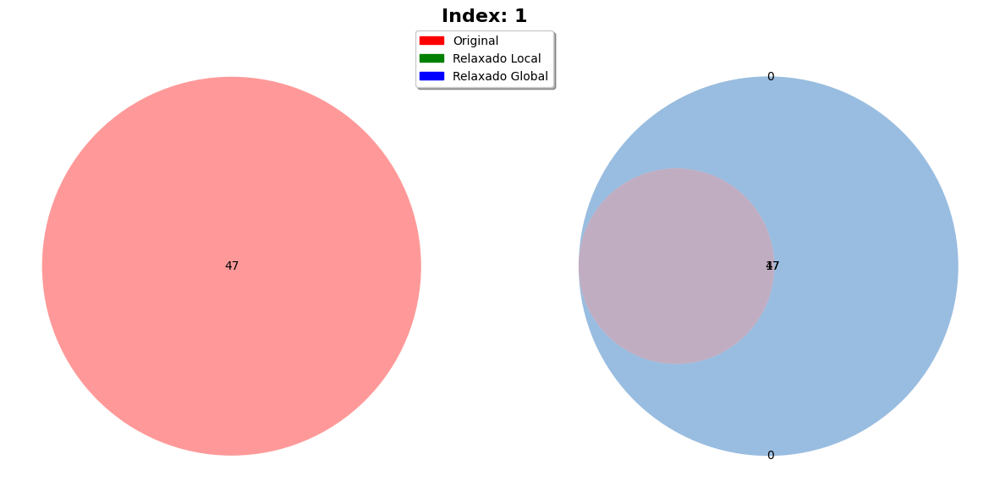

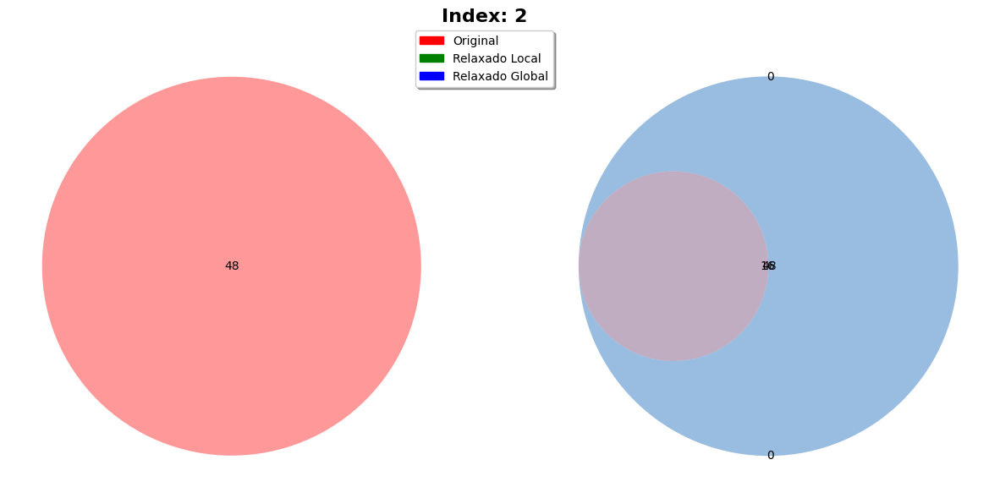

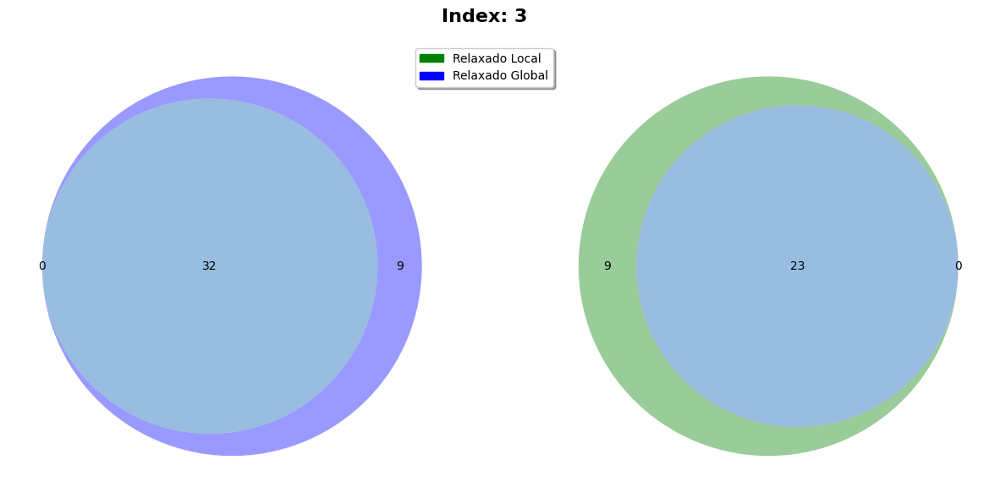

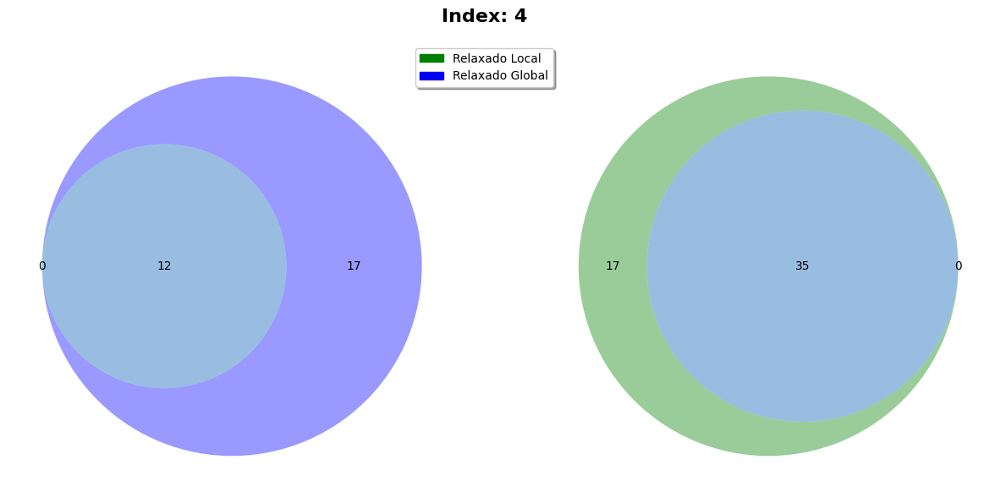

...

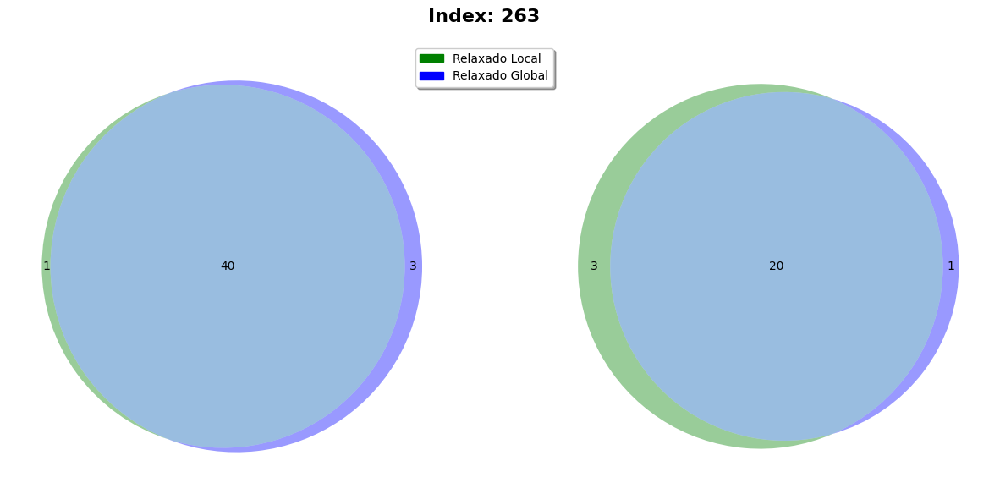

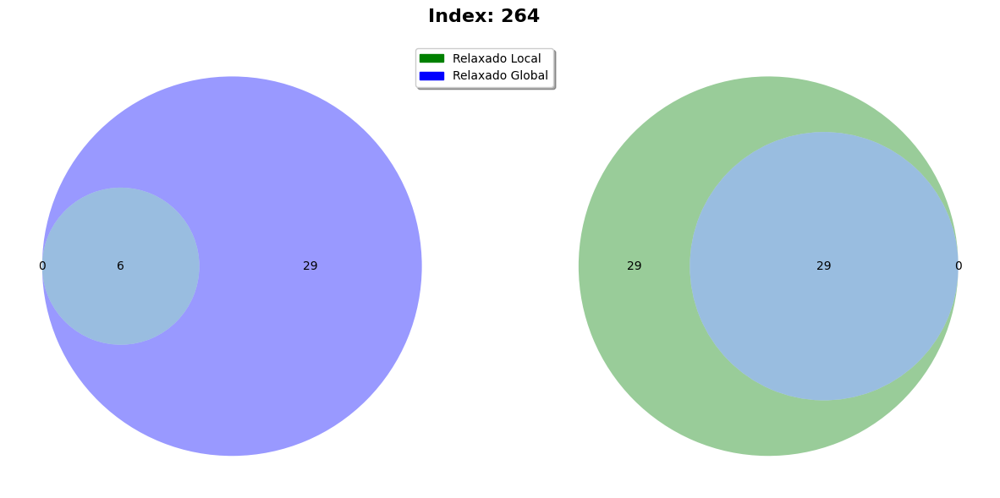

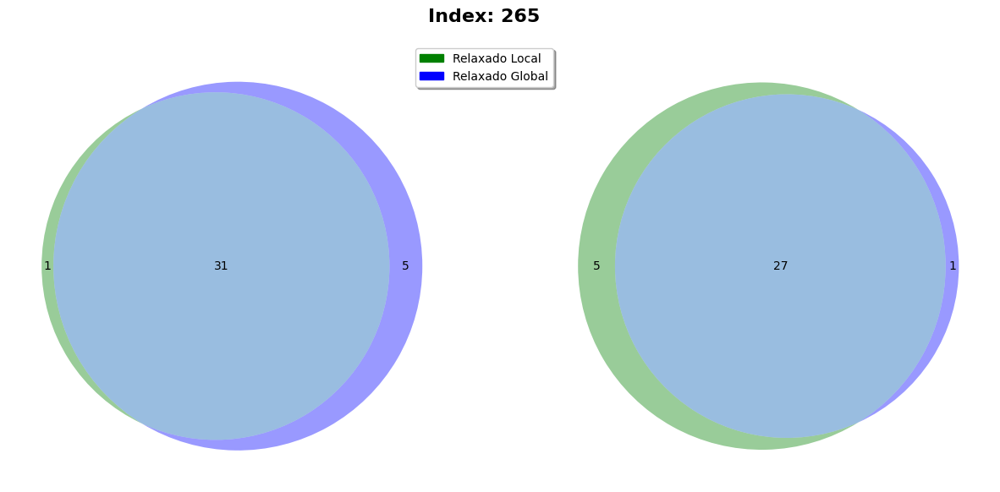

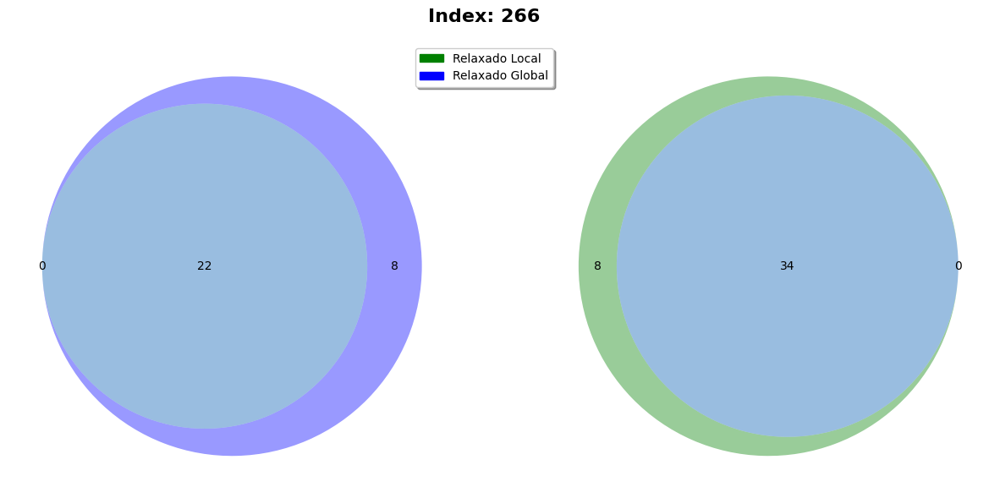

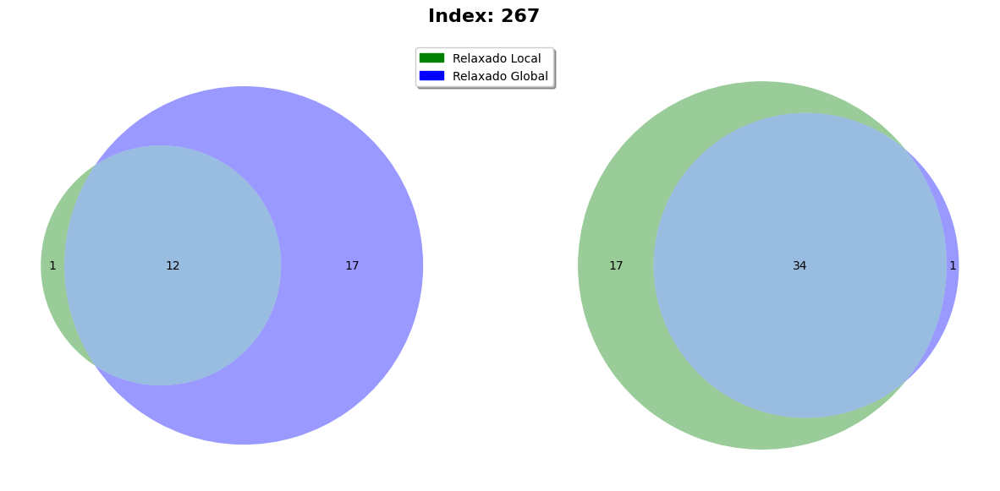

In [457]:

for index in range(len(result_df)):
    explanation = result_df.iloc[index]["explanation"]
    explanation_relaxed = result_df.iloc[index]["explanation_relaxed"]
    explanation_relaxed_global = result_df.iloc[index]["explanation_relaxed_global"]

    subsets, subsets_notna, legends = [], [], []
    set_colors = []
    if pd.notna(explanation):
        exp = string_to_list(explanation)
        subsets.append(set(exp))
        subsets_notna.append(set(not_in_explanation(exp)))
        legends.append(patches.Patch(color='red', label='Original'))
        set_colors.append('red')

    if pd.notna(explanation_relaxed):
        exp = string_to_list(explanation_relaxed)
        subsets.append(set(exp))
        subsets_notna.append(set(not_in_explanation(exp)))
        legends.append(patches.Patch(color='green', label='Relaxado Local'))
        set_colors.append('green')

    if pd.notna(explanation_relaxed_global):
        exp = string_to_list(explanation_relaxed_global)
        subsets.append(set(exp))
        subsets_notna.append(set(not_in_explanation(exp)))
        legends.append(patches.Patch(color='blue', label='Relaxado Global'))
        set_colors.append('blue')

    fig, axs = plt.subplots(1, 2, figsize=(15, 10))
    # print(subsets)
    for i, ax in enumerate(axs):
        v = venn2 if len(subsets) == 2 else venn3
        if i == 0:
            v(subsets,None, set_colors=set_colors, ax=ax)
        else:
            v(subsets_notna, None, set_colors=set_colors, ax=ax)

    # Adicionar título ao gráfico
    fig.suptitle(f'Index: {index}', fontsize=16, fontweight='bold', y = 0.8)
    fig.legend(handles = legends, loc='lower center', bbox_to_anchor=(0.5, 0.7), fancybox=True, shadow=True, ncol=1)
    plt.show()
